# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 26.03.2025

Мягкий дедлайн: 13.04.2025 23:59 MSK

Жёсткий дедлайн: 17.04.2025 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи).

Сдавать задание после указанного срока сдачи нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning.



In [1]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

<img src="https://media1.tenor.com/m/HleFU8PrawUAAAAC/sigh-ladybug.gif">

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [3]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans
from scipy.linalg import eigh

class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''
        
        D = np.diag(np.sum(X, axis=1))
        L = D - X
        _, eigenvectors = eigh(L)
        return eigenvectors[:, :self.n_components]

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [4]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Альтернативная ссылка: [отсюда](https://disk.yandex.ru/i/J0HlcDXd_KyIeg). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [5]:
data = pd.read_excel('transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [6]:
import folium

map = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map)
map

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [7]:
def haversine_array(lat1, lng1, lat2, lng2):
    lat1, lng1, lat2, lng2 = np.radians(lat1), np.radians(lng1), np.radians(lat2), np.radians(lng2)
    AVG_EARTH_RADIUS = 6371  # in km
    lat = lat2 - lat1
    lng = lng2 - lng1
    d = np.sin(lat * 0.5) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(lng * 0.5) ** 2
    h = 2 * AVG_EARTH_RADIUS * np.arcsin(np.sqrt(d))
    return h

In [8]:
from collections import defaultdict

def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''

    d = defaultdict(list)
    for i, row in data.iterrows():
        routes = row['RouteNumbers_en'].split('; ')
        for x in routes:
            d[x].append(i)
    return d


def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''

    d = defaultdict(list)
    for x in routes:
        lat_lng = data.loc[routes[x], ['Latitude_WGS84_en', 'Longitude_WGS84_en']].to_numpy()
        distance = np.zeros((len(lat_lng), len(lat_lng)))
        for i in range(len(lat_lng) - 1):
            for j in range(i + 1, len(lat_lng)):
                distance[i, j] = haversine_array(lat_lng[i][0].item(), lat_lng[i][1].item(), lat_lng[j][0].item(),lat_lng[j][1].item())
                distance[j, i] = distance[i, j]
        k = np.argmax(distance.sum(axis=1))
        distance[:, k] = np.inf
        d[x].append(routes[x][k])
        for i in range(len(routes[x]) - 1):
            k = np.argmin(distance[k])
            d[x].append(routes[x][k])
            distance[:, k] = np.inf
    return d


def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''

    n = data['Name_en'].nunique()
    m = np.zeros((n, n))
    for x in sorted_routes:
        for i in range(len(sorted_routes[x]) - 1):
            m[sorted_routes[x][i], sorted_routes[x][i + 1]] += 1
            m[sorted_routes[x][i + 1], sorted_routes[x][i]] += 1
    return m

In [9]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [10]:
map = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=5):
    coords = data.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords).add_to(map)

map

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [11]:
import random

def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''

    map = folium.Map([55.75215, 37.61819], zoom_start=12)
    color = ["#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)]) for _ in range(len(np.unique(labels)))]
    for (i, row), label in zip(data.iterrows(), labels):
        folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en], radius=10, color=color[label]).add_to(map)
    return map

**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации и подберите гиперпараметры так, чтобы кластеры получились осмысленными (нет такого, что все принадлежит одному кластеру или большая часть точек это шум):
- `sklearn.clustering.KMeans` - `n_clusters`
- `sklearn.clustering.DBSCAN` - `eps`
- ваш `SpectralClustering` - `n_clusters` и `n_components`

Для ряда алгоритмов, в частности DBSCAN, подобрать оптимальные параметры может быть ой, как непросто. Чтобы помочь сохранить нервные клетки рекомендуется пользоваться метриками Intrinsic Evaluation для кластеризации. Для каждого алгоритма скорее всего придется брать разные метрики, а может быть оптимизировать сразу несколько.

Ваша задача - выбрать подходящую метрику, можно взять что-то из списка ниже, можно спросить у гугла. Применить GridSearch, `optuna` или `hyperopt` и желательно завернуть отбор параметров в функцию, пригодится далее

1. $
   \text{Calinski-Harabasz Index} \in [0, \inf] = \frac{\sum_{i=1}^k BCSS_i/(k-1)}{\sum_{i=1}^k WCSS_i/(n-k)} = \frac{\sum_{i=1}^k n_i \| \mathbf{c}_i - \mathbf{c} \|^2/(k-1)}{\sum_{i=1}^k \sum_{\mathbf{x} \in C_i} \|\mathbf{x} - \mathbf{c}_i\|^2/(n-k)} \rightarrow max
   $
   - Отношение 1) расстояния от центра кластера до центра всех данных к 2) расстоянию от центра кластера до точки
   - Чем однороднее и дальше друг от друга кластеры, тем лучше
2. $
   \text{Silhouette Score} \in [0, 1] = \sum_i \frac{b_i - a_i}{\max(a_i, b_i)} \rightarrow max
   $
   - $a_i$ - среднее расстояние до точек внутри своего кластера
   - $b_i$ - среднее расстояние до точек из ближайшего кластера
   - Если в своем кластере точки близко - кластер плотный, идеальный вариант, скор равен 1, если свой кластер совпадает с соседним - кластеры неразделимы, скор равен нулю
   - Чем однороднее и разделимее кластеры, тем лучше
3. $\text{Davies-Bouldin Index} \in [0, inf] = \frac{1}{k} \sum_{i=1}^{k} \max_{j \neq i} \left( \frac{WCSS_i + WCSS_j}{d(c_i, c_j)} \right) \rightarrow min $
   - Отношение внутрикластерных расстояний к межкластерному расстоянию между двумя центрами
   - Если кластеры далеко друг от друга, но при этом однородные, скор наименьший
3. $\text{Elbow Method}$ - последовательное сравнение $WCSS$ из пункта 1 для разного числа параметров. Если уменьшение меньше определенного порога - останавливаемся, считаем это значение оптимальным

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.cluster import DBSCAN

def clustering_objective(algorithm, X, params):
    try:
        if algorithm == 'kmeans':
            model = KMeans(n_clusters=params['n_clusters'])
        elif algorithm == 'dbscan':
            model = DBSCAN(eps=params['eps'])
        elif algorithm == 'spectral':
            model = GraphClustering(n_clusters=params['n_clusters'], 
                                  n_components=params.get('n_components', params['n_clusters']))
        
        labels = model.fit_predict(X)
        unique_labels = np.unique(labels[labels != -1]) 
        
        if len(unique_labels) < 2:
            return {'silhouette': -1, 'calinski': -1, 'davies': float('inf')}
        
        if algorithm == 'kmeans' and len(unique_labels) < params['n_clusters']:
            return {'silhouette': -1, 'calinski': -1, 'davies': float('inf')}
        
        return {
            'silhouette': silhouette_score(X, labels),
            'calinski': calinski_harabasz_score(X, labels),
            'davies': davies_bouldin_score(X, labels)
        }
    except:
        return {'silhouette': -1, 'calinski': -1, 'davies': float('inf')}

Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`.

In [13]:
def find_best_params(algorithm, X, param_grid):
    best_score = -1
    best_params = None
    
    if algorithm == 'kmeans':
        for n_clusters in param_grid['n_clusters']:
            scores = clustering_objective(algorithm, X, {'n_clusters': n_clusters})
            if scores['silhouette'] > best_score:
                best_score = scores['silhouette']
                best_params = {'n_clusters': n_clusters}
    
    elif algorithm == 'dbscan':
        for eps in param_grid['eps']:
            scores = clustering_objective(algorithm, X, {'eps': eps})
            if scores['silhouette'] > best_score:
                best_score = scores['silhouette']
                best_params = {'eps': eps}
    
    elif algorithm == 'spectral':
        for n_clusters in param_grid['n_clusters']:
            for n_components in param_grid.get('n_components', [n_clusters]):
                scores = clustering_objective(algorithm, X, 
                                            {'n_clusters': n_clusters, 
                                             'n_components': n_components})
                if scores['silhouette'] > best_score:
                    best_score = scores['silhouette']
                    best_params = {'n_clusters': n_clusters, 
                                 'n_components': n_components}
    
    return best_params, best_score

In [14]:
from sklearn.preprocessing import StandardScaler

coords = data[['Latitude_WGS84_en', 'Longitude_WGS84_en']]
scaler = StandardScaler()
coords_scaled = scaler.fit_transform(coords)

In [319]:
kmeans_params = {'n_clusters': range(3, 100)}
best_kmeans_params, _ = find_best_params('kmeans', coords_scaled, kmeans_params)
kmeans = KMeans(n_clusters=best_kmeans_params['n_clusters'])
kmeans_labels = kmeans.fit_predict(coords_scaled)
draw_clustered_map(data, kmeans_labels)

In [18]:
dbscan_params = {'eps': np.linspace(0.0, 10.0, 100000)}
best_dbscan_params, _ = find_best_params('dbscan', coords_scaled, dbscan_params)
dbscan = DBSCAN(eps=best_dbscan_params['eps'], min_samples=2)
dbscan_labels = dbscan.fit_predict(coords_scaled)
draw_clustered_map(data, dbscan_labels)

In [343]:
spectral_params = {'n_clusters': range(2, 100)}
best_spectral_params, _ = find_best_params('spectral', adjacency_matrix, spectral_params)
spectral = GraphClustering(n_clusters=best_spectral_params['n_clusters'])
spectral_labels = spectral.fit_predict(adjacency_matrix)
draw_clustered_map(data, spectral_labels)

**Вопрос:** Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:** в K-means очень красивые, но незатейливые кластеры получились, это чем-то напоминает на разбиение по огругам по типу "юг", "юго-восток" и так далее. В DBSCAN вообще получилось что-то трудно интерпретируемое. Наверное спектральная больше всего подходит для этой задачи. 

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [19]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
2079,tech,256.txt,Poles play with GameBoy 'blip-pop',A group of artists in Poland has taken the ca...
2108,tech,285.txt,Format wars could 'confuse users',"Technology firms Sony, Philips, Matsushita an..."
956,politics,061.txt,Assembly ballot papers 'missing',Hundreds of ballot papers for the regional as...
18,business,019.txt,India widens access to telecoms,India has raised the limit for foreign direct...
214,business,215.txt,SEC to rethink post-Enron rules,The US stock market watchdog's chairman has s...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [20]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [21]:
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/konstantin/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [22]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/konstantin/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/konstantin/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/konstantin/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [23]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [24]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [25]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)

    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

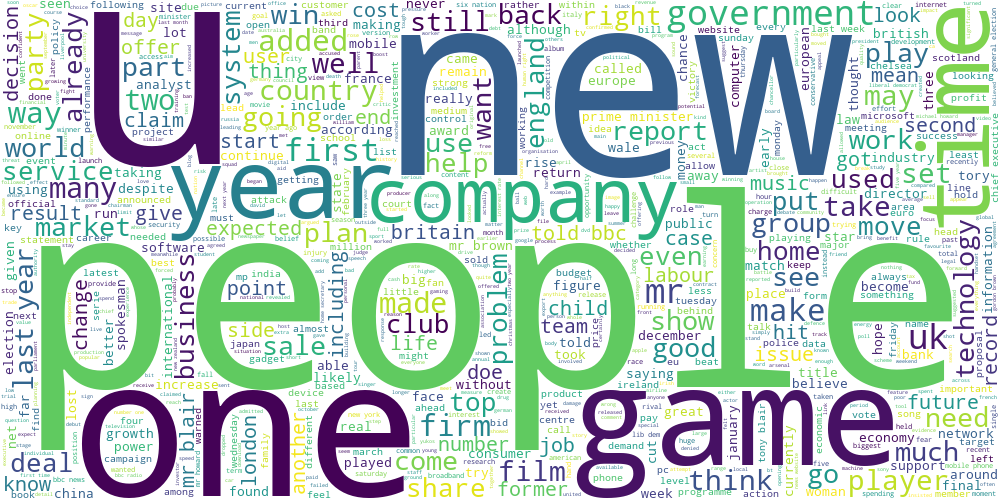

In [67]:
draw_wordcloud(data.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров.

In [80]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(min_df=5)
X = vectorizer.fit_transform(data['text'])
kmeans = KMeans()
kmeans_labels = kmeans.fit_predict(X)

In [81]:
d = defaultdict(list)

for i in range(len(kmeans_labels)):
    d[kmeans_labels[i]].append(i)

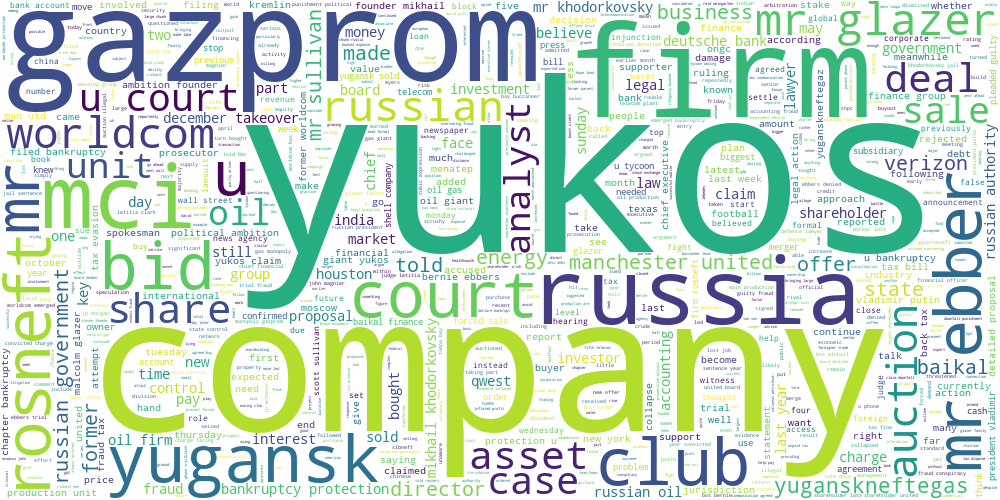

In [82]:
draw_wordcloud(data['text'].iloc[d[0]])

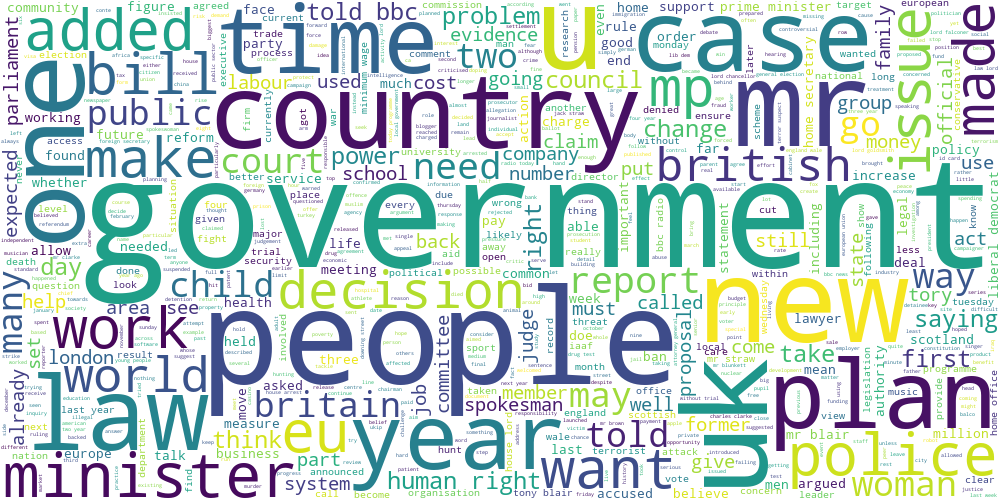

In [83]:
draw_wordcloud(data['text'].iloc[d[1]])

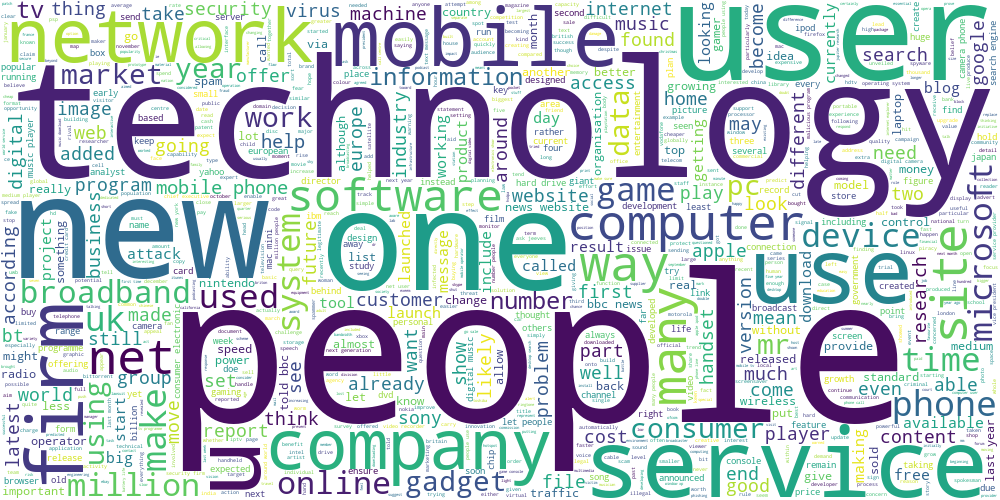

In [84]:
draw_wordcloud(data['text'].iloc[d[2]])

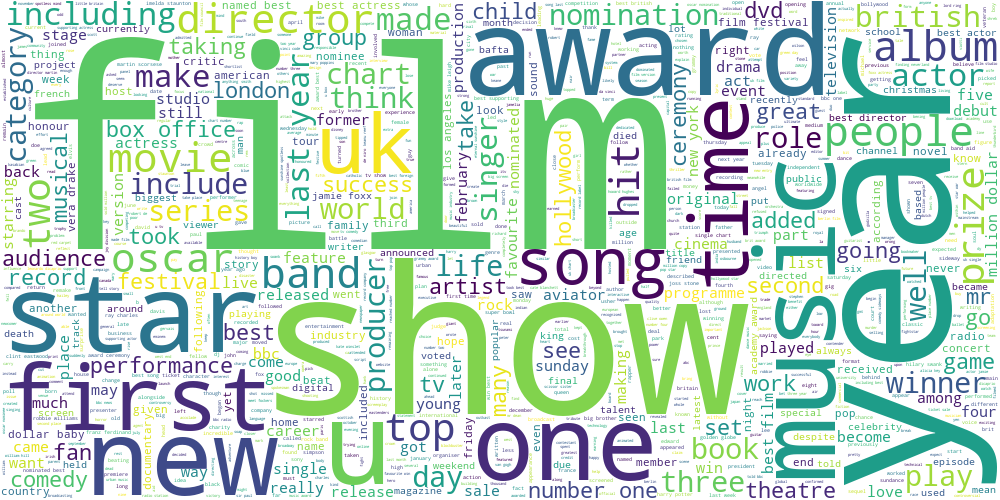

In [85]:
draw_wordcloud(data['text'].iloc[d[3]])

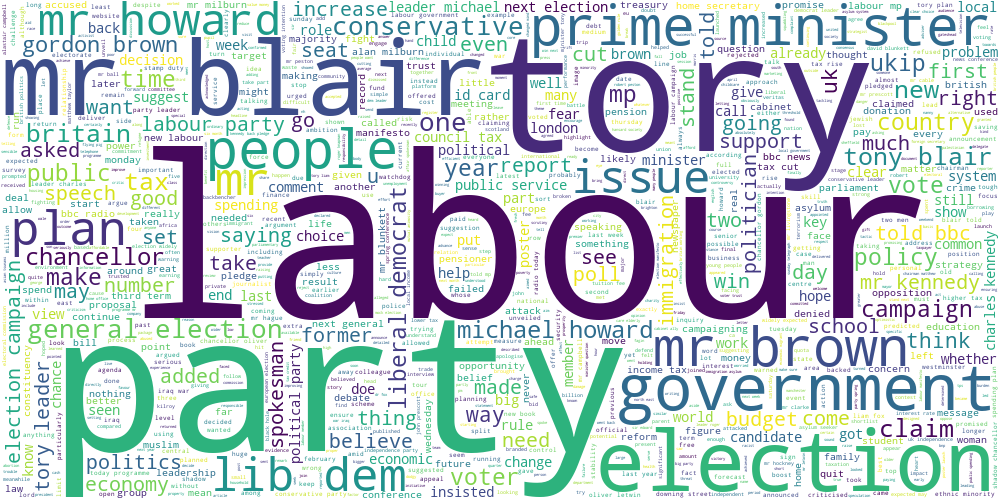

In [86]:
draw_wordcloud(data['text'].iloc[d[4]])

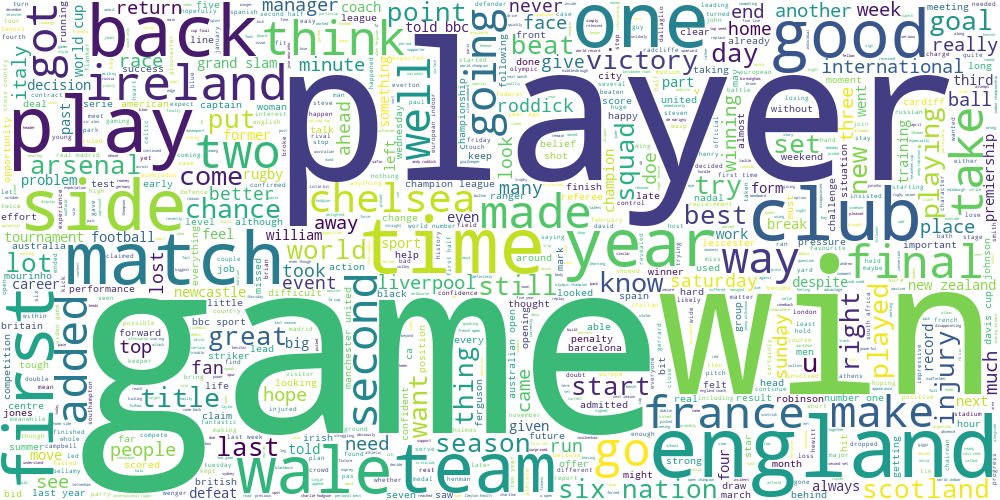

In [87]:
draw_wordcloud(data['text'].iloc[d[5]])

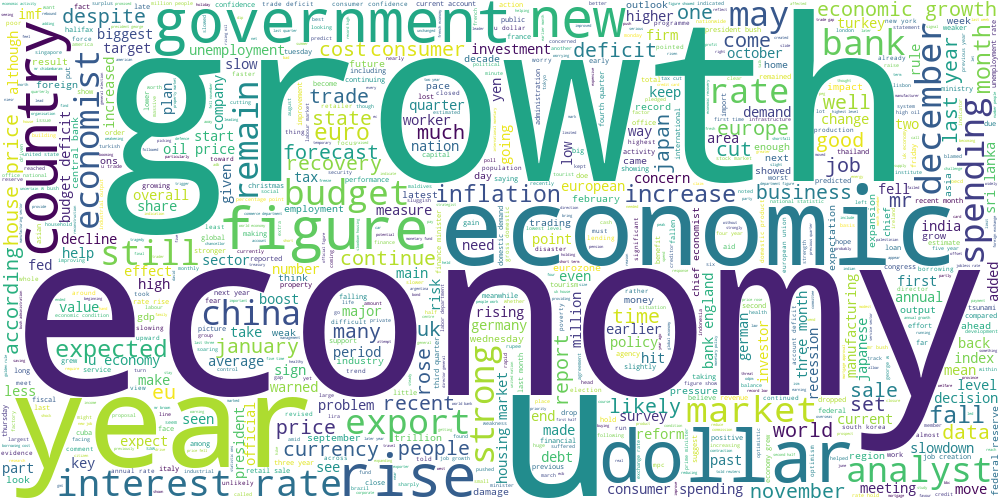

In [88]:
draw_wordcloud(data['text'].iloc[d[6]])

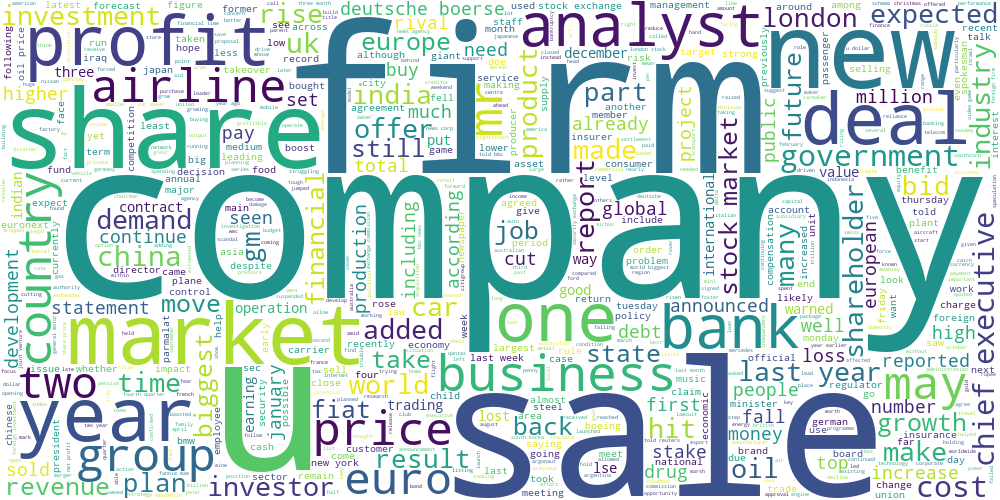

In [89]:
draw_wordcloud(data['text'].iloc[d[7]])

Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:** в целом темы действительно интерпретируемые:

1. торговля/взаимоотношени с Россией
1. политика
1. технологии
1. культура
1. политика
1. спорт
1. экономика
2. бизнес

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны.

In [90]:
vectorizer.get_feature_names_out()[kmeans.cluster_centers_.argmax(1)]

array(['yukos', 'mr', 'mobile', 'film', 'mr', 'game', 'economy',
       'company'], dtype=object)

Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:** в целом да, это одни из самых крупных слов в разделе, так что, как по мне, резульатт неплохой.

**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров (подумайте, как это можно сделать)

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [ ]:
from sklearn.cluster import SpectralClustering
spectral_labels = SpectralClustering().fit_predict(X)
dbscan_labels = DBSCAN(eps=0.825).fit_predict(X)

In [92]:
len(set(dbscan_labels))

8

In [97]:
from sklearn.manifold import TSNE

X_new = TSNE(n_components=2, init='random').fit_transform(X)

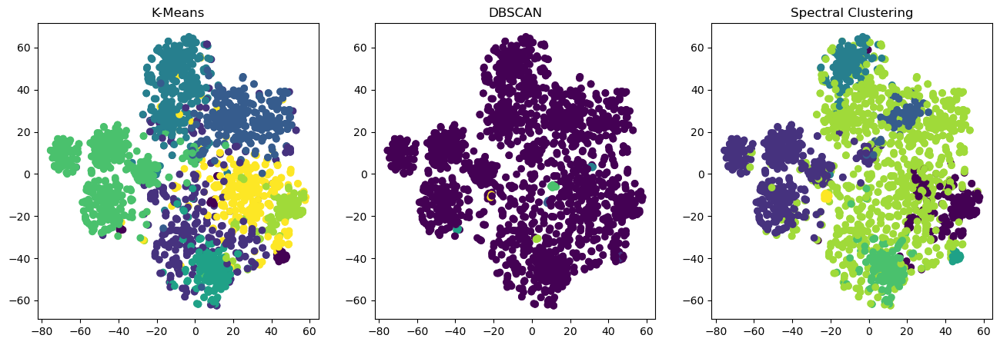

In [103]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 3, figsize=(16, 5))
ax[0].scatter(X_new[:,0], X_new[:, 1], c=kmeans_labels, label='K-means')
ax[1].scatter(X_new[:,0], X_new[:, 1], c=dbscan_labels, label='DBSCAN')
ax[2].scatter(X_new[:,0], X_new[:, 1], c=spectral_labels, label='Spectral Clustering')
ax[0].set_title('K-Means')
ax[1].set_title('DBSCAN')
ax[2].set_title('Spectral Clustering')
plt.show()

Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:** K-means харош в целом. DBSCAN реально плох, почти все в один запихнул. Спектральная неплоха, но в центре можно было получше раскидать. 

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means.

In [122]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

bow = CountVectorizer(min_df=5).fit_transform(data['text'])

lda_labels = LatentDirichletAllocation(24).fit_transform(bow).argmax(1)

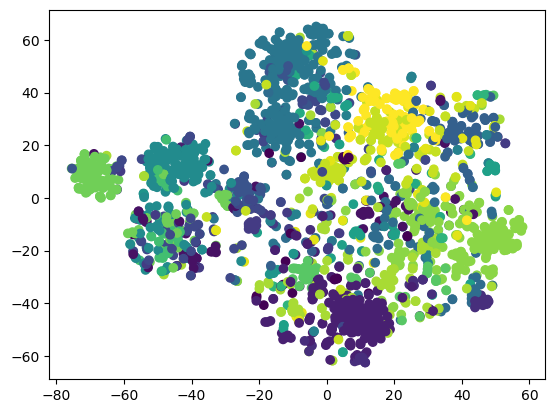

In [123]:
plt.scatter(X_new[:,0], X_new[:, 1], c=lda_labels)
plt.show()

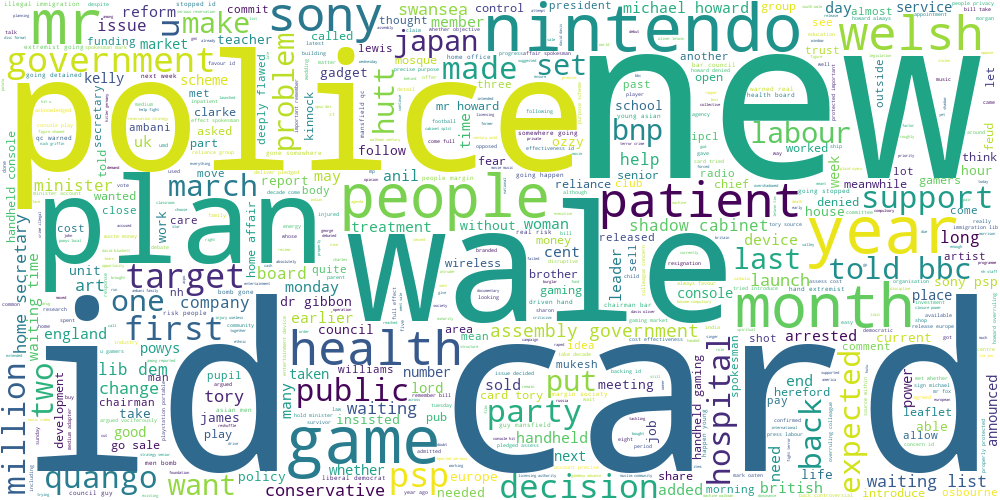

In [124]:
draw_wordcloud(data['text'].loc[lda_labels==0])

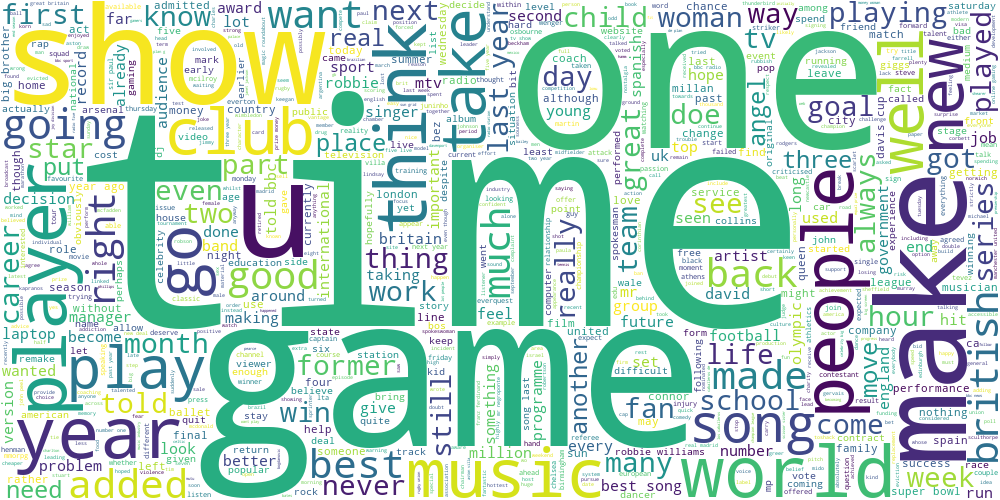

In [125]:
draw_wordcloud(data['text'].loc[lda_labels==5])

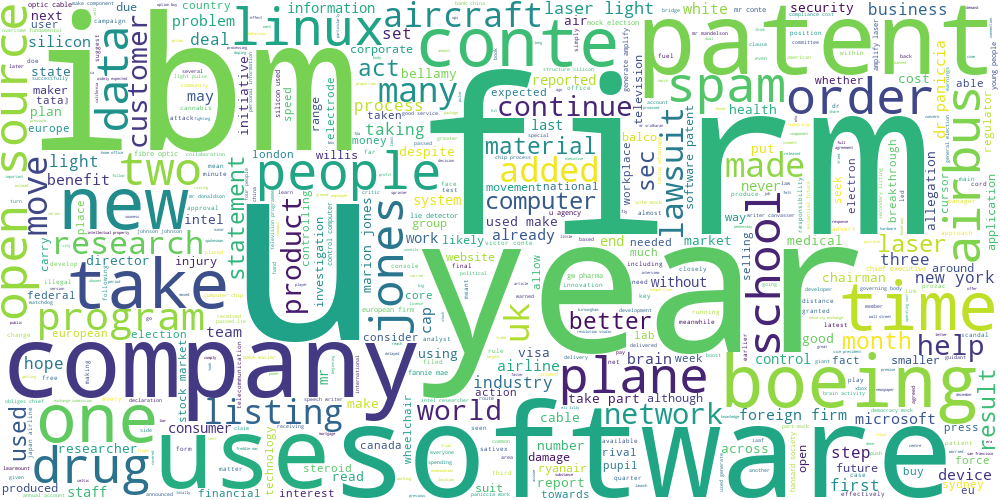

In [126]:
draw_wordcloud(data['text'].loc[lda_labels==10])

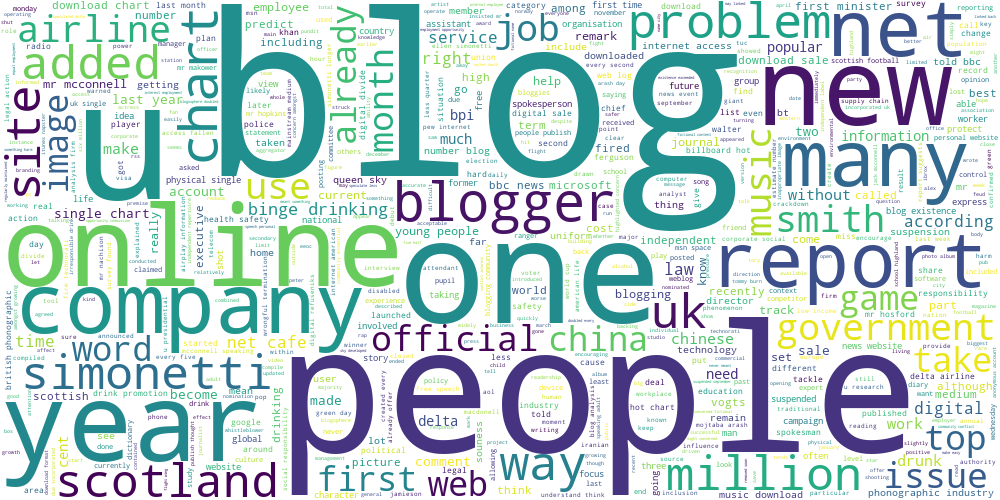

In [127]:
draw_wordcloud(data['text'].loc[lda_labels==15])

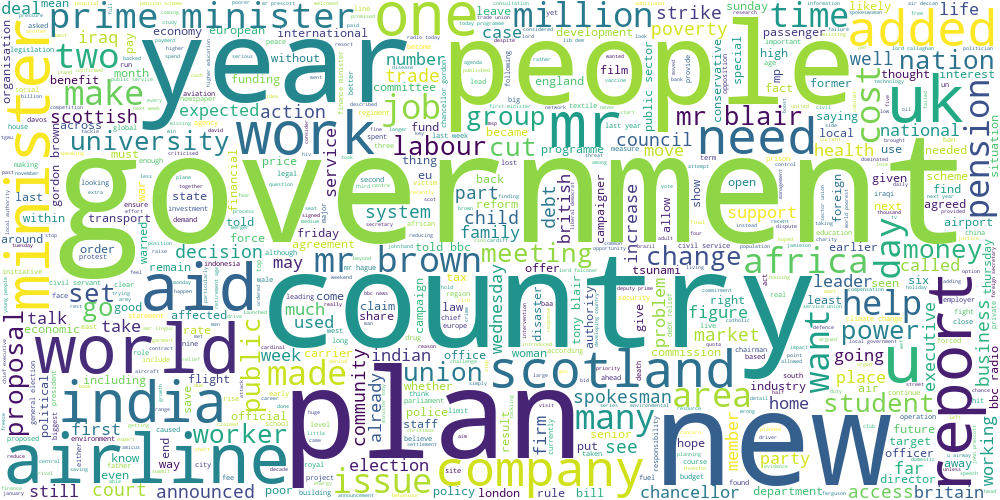

In [128]:
draw_wordcloud(data['text'].loc[lda_labels==20])

Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:** в целом наверное да. 

## Часть 3. Transfer learning и Self-Supervised Learning для задачи классификации текстов

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [222]:
y = data['category'].copy()
for i, x in enumerate(set(data['category'])):
    y[y == x] = i 
y = y.astype(int)

In [223]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(data['text'], y, test_size=0.1, random_state=42)

In [224]:
from sklearn.linear_model import LogisticRegression

vectorizer = TfidfVectorizer(min_df=5)
x_train_1 = vectorizer.fit_transform(x_train)
x_test_1 = vectorizer.transform(x_test)
model = LogisticRegression().fit(x_train_1, y_train)

In [225]:
from sklearn.metrics import accuracy_score

print(f'Accuracy on train for logisric regression with tf-idf: {accuracy_score(y_train, model.predict(x_train_1)):.3f}')
print(f'Accuracy on test for logisric regression with tf-idf: {accuracy_score(y_test, model.predict(x_test_1)):.3f}')

Accuracy on train for logisric regression with tf-idf: 0.996
Accuracy on test for logisric regression with tf-idf: 0.978


In [226]:
kmeans = KMeans(random_state=42)
kmeans_train = kmeans.fit_transform(x_train_1)
kmeans_test = kmeans.transform(x_test_1)

In [227]:
model = LogisticRegression().fit(kmeans_train, y_train)

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [228]:
print(f'Accuracy on train for K-means with tf-idf + logistic regression: {accuracy_score(y_train, model.predict(kmeans_train)):.3f}')
print(f'Accuracy on test for K-means with tf-idf + logistic regression: {accuracy_score(y_test, model.predict(kmeans_test)):.3f}')

Accuracy on train for K-means with tf-idf + logistic regression: 0.896
Accuracy on test for K-means with tf-idf + logistic regression: 0.870


In [229]:
bow = CountVectorizer(min_df=5)
lda = LatentDirichletAllocation(random_state=42)
lda_train = lda.fit_transform(bow.fit_transform(x_train))
lda_test = lda.transform(bow.transform(x_test))

In [230]:
model = LogisticRegression().fit(lda_train, y_train)

In [231]:
print(f'Accuracy on train for DLA + logistic regression: {accuracy_score(y_train, model.predict(lda_train)):.3f}')
print(f'Accuracy on test for DLA + logistic regression: {accuracy_score(y_test, model.predict(lda_test)):.3f}')

Accuracy on train for DLA + logistic regression: 0.933
Accuracy on test for DLA + logistic regression: 0.964


У какой модели получилось лучшее качество? С чем это связано?

**Ответ:** на удивление, у обычного логрега с tf-idf получилось лучшее качество. 

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации.

In [232]:
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.3, random_state=42)
x_train_supervised, x_train_unsupervised, y_train_supervised, y_train_unsupervised = train_test_split(x_train, y_train, test_size=65/70, random_state=42)

In [233]:
vectorizer = TfidfVectorizer(min_df=5)
x_train_1 = vectorizer.fit_transform(x_train)
x_train_supervised_1 = vectorizer.transform(x_train_supervised)
x_val_1 = vectorizer.transform(x_val)
x_test_1 = vectorizer.transform(x_test)

In [234]:
import optuna

def objective(trial):
    model = LogisticRegression(C=trial.suggest_float('C', 0, 10))
    model.fit(x_train_supervised_1, y_train_supervised)
    return accuracy_score(y_val, model.predict(x_val_1))

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

[I 2025-04-12 22:40:32,836] A new study created in memory with name: no-name-be777d9e-e826-48d8-b843-ef014701effe
[I 2025-04-12 22:40:32,867] Trial 0 finished with value: 0.9267886855241264 and parameters: {'C': 1.7217455652098024}. Best is trial 0 with value: 0.9267886855241264.
[I 2025-04-12 22:40:32,906] Trial 1 finished with value: 0.940099833610649 and parameters: {'C': 4.688429161320846}. Best is trial 1 with value: 0.940099833610649.
[I 2025-04-12 22:40:32,967] Trial 2 finished with value: 0.940099833610649 and parameters: {'C': 6.478487312138828}. Best is trial 1 with value: 0.940099833610649.
[I 2025-04-12 22:40:33,005] Trial 3 finished with value: 0.9334442595673876 and parameters: {'C': 2.725433864387915}. Best is trial 1 with value: 0.940099833610649.
[I 2025-04-12 22:40:33,049] Trial 4 finished with value: 0.940099833610649 and parameters: {'C': 6.963360523064952}. Best is trial 1 with value: 0.940099833610649.
[I 2025-04-12 22:40:33,119] Trial 5 finished with value: 0.941

In [235]:
model_1 = LogisticRegression(C=study.best_params['C']).fit(x_train_supervised_1, y_train_supervised)
print(f'Accuracy on test for logisric regression with tf-idf: {accuracy_score(y_test, model_1.predict(x_test_1)):.3f}')

Accuracy on test for logisric regression with tf-idf: 0.951


In [236]:
def objective(trial):
    kmeans = KMeans(n_clusters=trial.suggest_int('n_clusters', 3, 16), random_state=42)
    kmeans.fit(x_train_1)
    kmeans_dist_train = kmeans.transform(x_train_supervised_1)
    kmeans_dist_test = kmeans.transform(x_val_1)
    model = LogisticRegression(C=trial.suggest_float('C', 0, 10))
    model.fit(kmeans_dist_train, y_train_supervised)
    return accuracy_score(y_val, model.predict(kmeans_dist_test))

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

[I 2025-04-12 22:40:38,777] A new study created in memory with name: no-name-7bddb311-589d-4c48-987b-7af9f3213f68
[I 2025-04-12 22:40:38,947] Trial 0 finished with value: 0.8469217970049917 and parameters: {'n_clusters': 10, 'C': 8.197265027087614}. Best is trial 0 with value: 0.8469217970049917.
[I 2025-04-12 22:40:39,015] Trial 1 finished with value: 0.8718801996672213 and parameters: {'n_clusters': 13, 'C': 9.50226857846595}. Best is trial 1 with value: 0.8718801996672213.
[I 2025-04-12 22:40:39,026] Trial 2 finished with value: 0.34775374376039936 and parameters: {'n_clusters': 3, 'C': 6.728174848289974}. Best is trial 1 with value: 0.8718801996672213.
[I 2025-04-12 22:40:39,086] Trial 3 finished with value: 0.8502495840266223 and parameters: {'n_clusters': 10, 'C': 9.217654514981037}. Best is trial 1 with value: 0.8718801996672213.
[I 2025-04-12 22:40:39,109] Trial 4 finished with value: 0.7820299500831946 and parameters: {'n_clusters': 6, 'C': 8.1165127523321}. Best is trial 1 wi

In [237]:
kmeans = KMeans(n_clusters=study.best_params['n_clusters'], random_state=42)
kmeans.fit(x_train_1)
kmeans_train = kmeans.transform(x_train_supervised_1)
kmeans_test = kmeans.transform(x_test_1)
model_2 = LogisticRegression(C=study.best_params['C']).fit(kmeans_train, y_train_supervised)
print(f'Accuracy on test for K-means with tf-idf + logistic regression: {accuracy_score(y_test, model_2.predict(kmeans_test)):.3f}')

Accuracy on test for K-means with tf-idf + logistic regression: 0.888


In [238]:
bow = CountVectorizer(min_df=5)
x_train_1 = bow.fit_transform(x_train)
x_train_supervised_1 = bow.transform(x_train_supervised)
x_val_1 = bow.transform(x_val)
x_test_1 = bow.transform(x_test)

In [239]:
def objective(trial):
    lda = LatentDirichletAllocation(n_components=trial.suggest_int('n_clusters', 3, 30), random_state=42)
    lda.fit(x_train_1)
    lda_train = lda.transform(x_train_supervised_1)
    lda_test = lda.transform(x_val_1)
    model = LogisticRegression(C=trial.suggest_float('C', 0, 10))
    model.fit(lda_train, y_train_supervised)
    return accuracy_score(y_val, model.predict(lda_test))

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)

[I 2025-04-12 22:40:42,419] A new study created in memory with name: no-name-595f7170-710e-44d8-a6a6-8c3ed7fa8d9a
[I 2025-04-12 22:40:47,000] Trial 0 finished with value: 0.9118136439267887 and parameters: {'n_clusters': 17, 'C': 3.1547046583809824}. Best is trial 0 with value: 0.9118136439267887.
[I 2025-04-12 22:40:50,135] Trial 1 finished with value: 0.5424292845257903 and parameters: {'n_clusters': 5, 'C': 0.014252158971618245}. Best is trial 0 with value: 0.9118136439267887.
[I 2025-04-12 22:40:55,023] Trial 2 finished with value: 0.9467554076539102 and parameters: {'n_clusters': 24, 'C': 5.81109421152023}. Best is trial 2 with value: 0.9467554076539102.
[I 2025-04-12 22:40:59,714] Trial 3 finished with value: 0.891846921797005 and parameters: {'n_clusters': 17, 'C': 0.7264264749734983}. Best is trial 2 with value: 0.9467554076539102.
[I 2025-04-12 22:41:02,964] Trial 4 finished with value: 0.930116472545757 and parameters: {'n_clusters': 9, 'C': 3.4812942567652607}. Best is trial

In [240]:
lda = LatentDirichletAllocation(n_components=study.best_params['n_clusters'], random_state=42)
lda_train = lda.fit(x_train_1)
lda_train_supervised = lda.transform(x_train_supervised_1)
lda_test = lda.transform(x_test_1)
model_3 = LogisticRegression(C=study.best_params['C']).fit(lda_train_supervised, y_train_supervised)
print(f'Accuracy on test for DLA + logistic regression: {accuracy_score(y_test, model_3.predict(lda_test)):.3f}')

Accuracy on test for DLA + logistic regression: 0.915


Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:** ну вот второй метод реально прям лучше стал работать, но не намного. Все-таки где-то может быть это и помогает. 

## Бонус

**Задание 4 (0.5 балла)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

In [ ]:
from scipy.sparse import vstack

vectorizer = TfidfVectorizer(min_df=5)
x_train_1 = vectorizer.fit_transform(x_train)
x_train_supervised_1 = vectorizer.transform(x_train_supervised)
x_train_unsupervised_1 = vectorizer.transform(x_train_unsupervised)
x_val_1 = vectorizer.transform(x_val)
x_test_1 = vectorizer.transform(x_test)
y_semi = np.hstack((y_train_supervised, -np.ones_like(y_train_unsupervised)))
x_semi = vstack((x_train_supervised_1, x_train_unsupervised_1))

In [242]:
from sklearn.semi_supervised import SelfTrainingClassifier

def objective(trial):
    model = LogisticRegression(C=trial.suggest_float('C', 0, 10))
    stc = SelfTrainingClassifier(model, threshold=trial.suggest_float('threshold', 0.5, 1.0)).fit(x_semi, y_semi)
    return accuracy_score(y_val, stc.predict(x_val_1))

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=20)

[I 2025-04-12 22:41:30,292] A new study created in memory with name: no-name-0ca62f47-8844-4904-b0f2-03688343a878
[I 2025-04-12 22:41:31,255] Trial 0 finished with value: 0.9450915141430949 and parameters: {'C': 4.14182478827417, 'threshold': 0.6153589281104199}. Best is trial 0 with value: 0.9450915141430949.
[I 2025-04-12 22:41:31,311] Trial 1 finished with value: 0.9267886855241264 and parameters: {'C': 1.751175128646073, 'threshold': 0.8865398105585791}. Best is trial 0 with value: 0.9450915141430949.
[I 2025-04-12 22:41:32,238] Trial 2 finished with value: 0.8768718801996672 and parameters: {'C': 6.237939842384011, 'threshold': 0.7625012881441435}. Best is trial 0 with value: 0.9450915141430949.
[I 2025-04-12 22:41:32,270] Trial 3 finished with value: 0.7154742096505824 and parameters: {'C': 0.2800393616002139, 'threshold': 0.7310864491750424}. Best is trial 0 with value: 0.9450915141430949.
[I 2025-04-12 22:41:33,427] Trial 4 finished with value: 0.9434276206322796 and parameters

In [243]:
model = SelfTrainingClassifier(LogisticRegression(C=study.best_params['C']), threshold=study.best_params['threshold'])
model.fit(x_semi, y_semi)
print(f"Accuracy: {accuracy_score(y_test, model.predict(x_test_1)):.3f}")

Accuracy: 0.951


Улучшение мизерное.

**Задание 5 (1 балл)**. На занятиях мы обсуждали, что метрика [BCubed](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf) хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). Реализуйте подсчет метрики BCubed и сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

In [257]:
from collections import defaultdict

def bcubed_score(true_labels, pred_labels):
    true_labels = np.array(true_labels)
    pred_labels = np.array(pred_labels)
    
    cluster_to_items = defaultdict(list)
    class_to_items = defaultdict(list)
    
    for idx, (true, pred) in enumerate(zip(true_labels, pred_labels)):
        cluster_to_items[pred].append(idx)
        class_to_items[true].append(idx)
    
    precision_scores = []
    recall_scores = []
    
    for i in range(len(true_labels)):
        true_class = true_labels[i]
        pred_cluster = pred_labels[i]
        cluster_items = cluster_to_items[pred_cluster]
        class_items = class_to_items[true_class]
        correct_in_cluster = len(set(cluster_items) & set(class_items))
        precision_i = correct_in_cluster / len(cluster_items) if cluster_items else 0
        precision_scores.append(precision_i)
        recall_i = correct_in_cluster / len(class_items) if class_items else 0
        recall_scores.append(recall_i)
    
    precision = np.mean(precision_scores)
    recall = np.mean(recall_scores)
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    return {'precision': precision, 'recall': recall, 'f1': f1}

In [258]:
bcubed_score(y_test, model_1.predict(x_test_1))

{'precision': 0.9071442807317248,
 'recall': 0.9066461645062842,
 'f1': 0.9068951542208677}

In [259]:
bcubed_score(y_test, model_2.predict(kmeans_test))

{'precision': 0.8139872944693571,
 'recall': 0.8167621908425592,
 'f1': 0.8153723817630217}

In [260]:
bcubed_score(y_test, model_3.predict(lda_test))

{'precision': 0.8458264221200492,
 'recall': 0.8441313086462726,
 'f1': 0.8449780152406879}

**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии. Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое. Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***.

In [1]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 7 (1 балл)**. Наконец, ставший ежегодной традицией социализационный бонус. Мы поощряем не только предметное, но и духовное развитие. Поэтому, чтобы заработать балл за это задание, сходите на какую-нибудь выставку, в музей, театр, или наконец в церковь, напишите небольшой отчетик о ваших впечатлениях и добавьте фотопруфы в ноутбук при сдаче. Можете объединиться с одногруппниками/однокурсниками, а также пригласить ассистентов/преподавателей, они тоже будут рады выбраться куда-нибудь. Для вдохновения приведем ссылку на актуальные выставки [новой](https://www.youtube.com/watch?v=dQw4w9WgXcQ&ab) и [старой Третьяковки](https://www.youtube.com/watch?v=xm3YgoEiEDc) (но совсем не обязательно посещать именно их).

In [ ]:
# YOUR CODE HERE (ノಠ益ಠ)ノ彡┻━┻